<a href="https://colab.research.google.com/github/nihilkottal/GIS_class/blob/main/PS4_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

ps3 presentation comments:

good topic, yes, traffic relevant!

but heatmap doesnt dentote traffic volume but density of points that show traffic

i like ('Weekly Total Delay and Average Wait per Vehicle by Urban Area')

can look at the cost of ads

and do have interpretations in text


aok: presentation comments:

interesting topic

land value and coastal maybe color ramp with 3 colors; cut zeros, have numbers like in thousands; make it easy to read

finally someone did histogram!!!

### My Analysis

As a foreign national in New Jersey,US I would like to reasearch and know what kind of business/product to set up based on Race/Ethnicty, Median Income, age of the population and also based on the availability of public transport.

### Resources

I Obtained the population data (Race and ethnicity)  from US Census website https://data.census.gov/all/tables?t=-03&g=010XX00US,$0400000,$1400000&y=2021

The geographical NJ shapefile can be downlaoded from https://www.census.gov/geographies/mapping-files/time-series/geo/tiger-line-file.2022.html#list-tab-790442341

Public transport shapefiles for NJ can be downloaded from https://njogis-newjersey.opendata.arcgis.com/datasets/e6701817be974795aecc7f7a8cc42f79_0/explore

The property details and value can be downloaded from https://www.njfuture.org/smart-growth-101/sources-of-smart-growth-data/


In [1]:
import os, zipfile
import pandas as pd
import matplotlib.pyplot as plt

#will display all output not just last command
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

from google.colab import data_table
data_table.enable_dataframe_formatter() #this enables spreadsheet view upon calling dataframe (without() )

In [2]:
! pip install geopandas
!pip install mapclassify
import geopandas as gpd
import mapclassify

## Mapping the NJ Sate

In [3]:
! wget -q -O nj-counties.zip https://docs.google.com/uc?id=1xJDhcRCkgv7k4tNCa72Oog5bohV6dTB2&export=download
zip_ref = zipfile.ZipFile('nj-counties.zip', 'r'); zip_ref.extractall(); zip_ref.close() #just unzipping
njC=gpd.read_file('nj_counties.shp')

<Axes: >

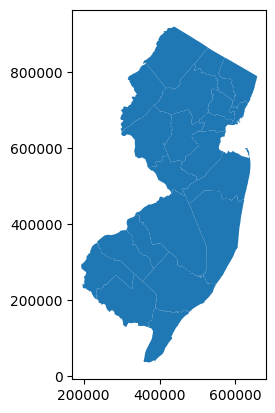

In [4]:
#plot the map
njC.plot()

In [5]:
njC.head(2)

,COUNTY,COUNTY_LAB,CO,GNIS_NAME,GNIS,FIPSSTCO,FIPSCO,ACRES,SQ_MILES,POP2010,...,POP1990,POP1980,POPDEN2010,POPDEN2000,POPDEN1990,POPDEN1980,REGION,Shape_Leng,Shape_Area,geometry
0,ATLANTIC,Atlantic County,ATL,County of Atlantic,882270,34001,1,390815.404215,610.649069,274549,...,275372,204615,450,414,451,335,COASTAL,650228.153906,1.702385e+10,"POLYGON ((443056.010 311529.770, 443068.440 31..."
1,BERGEN,Bergen County,BER,County of Bergen,882271,34003,3,153490.275182,239.828555,905116,...,829592,849843,3774,3686,3459,3544,NORTHEASTERN,443326.122021,6.686010e+09,"POLYGON ((656200.963 783614.366, 656141.127 78..."


### Uploading the population data


In [6]:
import pandas as pd
! wget -q -O nj-counties.zip https://github.com/nihilkottal/GIS_class/raw/main/ACSDT5YSPT2021.B01001_2023-09-12T121735.zip

zip_ref = zipfile.ZipFile('nj-counties.zip', 'r'); zip_ref.extractall(); zip_ref.close() #just unzipping

##Droping the columns with the below mentioned keyword
exclude_columns_with_string = 'Annotation'
exclude_columns_with_string2 = 'Margin'

njC_population=pd.read_csv('ACSDT5YSPT2021.B01001-Data.csv',header = 1,usecols=lambda column: exclude_columns_with_string not in column and exclude_columns_with_string2 not in column)

In [7]:
njC_population.head(2)

,Geography,Geographic Area Name,Race/Ethnic Group,Population Groups,Estimate!!Total:,Estimate!!Total:!!Male:,Estimate!!Total:!!Male:!!Under 5 years,Estimate!!Total:!!Male:!!5 to 9 years,Estimate!!Total:!!Male:!!10 to 14 years,Estimate!!Total:!!Male:!!15 to 17 years,...,Estimate!!Total:!!Female:!!55 to 59 years,Estimate!!Total:!!Female:!!60 and 61 years,Estimate!!Total:!!Female:!!62 to 64 years,Estimate!!Total:!!Female:!!65 and 66 years,Estimate!!Total:!!Female:!!67 to 69 years,Estimate!!Total:!!Female:!!70 to 74 years,Estimate!!Total:!!Female:!!75 to 79 years,Estimate!!Total:!!Female:!!80 to 84 years,Estimate!!Total:!!Female:!!85 years and over,Unnamed: 200
0,0500000US34001,"Atlantic County, New Jersey",32,Asian Indian alone or in any combination,7014,3748,259,166,267,123,...,129,108,52,111,267,37,137,21,17,NaN
1,0500000US34003,"Bergen County, New Jersey",13,Asian Indian alone,35041,17407,1362,984,1203,681,...,1083,338,368,326,449,427,308,165,115,NaN


### Cleaning the data

In [8]:
#Creating a new column for Population groups with uniform ethnic name.

def categorize_text(text):
    if 'asian' in text.lower():
        return 'Indian'
    elif 'chinese' in text.lower():
        return 'Chinese'
    elif 'filipino' in text.lower():
        return 'Filipino'
    elif 'korean' in text.lower():
        return 'Korean'
    elif 'pakistani' in text.lower():
        return 'Pakistani'
    elif 'japanese' in text.lower():
        return 'Japanese'
    else:
        return 'Other'

# Apply the function to create a new column
njC_population['category'] = njC_population['Population Groups'].apply(categorize_text)


In [9]:
##Checking the newly created column
njC_population['category'].unique()

array(['Indian', 'Chinese', 'Filipino', 'Korean', 'Japanese', 'Pakistani'],
      dtype=object)

In [10]:
##Grouping people based on their age
cols = ['Estimate!!Total:!!Male:!!Under 5 years', 'Estimate!!Total:!!Male:!!5 to 9 years','Estimate!!Total:!!Male:!!10 to 14 years','Estimate!!Total:!!Male:!!15 to 17 years']
cols2 = ['Estimate!!Total:!!Male:!!18 and 19 years', 'Estimate!!Total:!!Male:!!20 years', 'Estimate!!Total:!!Male:!!21 years', 'Estimate!!Total:!!Male:!!22 to 24 years', 'Estimate!!Total:!!Male:!!25 to 29 years', 'Estimate!!Total:!!Male:!!30 to 34 years', 'Estimate!!Total:!!Male:!!35 to 39 years', 'Estimate!!Total:!!Male:!!40 to 44 years', 'Estimate!!Total:!!Male:!!45 to 49 years', 'Estimate!!Total:!!Male:!!50 to 54 years', 'Estimate!!Total:!!Male:!!55 to 59 years', 'Estimate!!Total:!!Male:!!60 and 61 years', 'Estimate!!Total:!!Male:!!62 to 64 years', 'Estimate!!Total:!!Male:!!65 and 66 years']
cols3 = ['Estimate!!Total:!!Male:!!67 to 69 years', 'Estimate!!Total:!!Male:!!70 to 74 years', 'Estimate!!Total:!!Male:!!75 to 79 years', 'Estimate!!Total:!!Male:!!80 to 84 years', 'Estimate!!Total:!!Male:!!85 years and over']
cols4 = ['Estimate!!Total:!!Female:!!Under 5 years', 'Estimate!!Total:!!Female:!!5 to 9 years', 'Estimate!!Total:!!Female:!!10 to 14 years', 'Estimate!!Total:!!Female:!!15 to 17 years']
cols5 = ['Estimate!!Total:!!Female:!!18 and 19 years', 'Estimate!!Total:!!Female:!!20 years', 'Estimate!!Total:!!Female:!!21 years', 'Estimate!!Total:!!Female:!!22 to 24 years', 'Estimate!!Total:!!Female:!!25 to 29 years', 'Estimate!!Total:!!Female:!!30 to 34 years', 'Estimate!!Total:!!Female:!!35 to 39 years', 'Estimate!!Total:!!Female:!!40 to 44 years', 'Estimate!!Total:!!Female:!!45 to 49 years', 'Estimate!!Total:!!Female:!!50 to 54 years', 'Estimate!!Total:!!Female:!!55 to 59 years', 'Estimate!!Total:!!Female:!!60 and 61 years', 'Estimate!!Total:!!Female:!!62 to 64 years', 'Estimate!!Total:!!Female:!!65 and 66 years']
cols6 = ['Estimate!!Total:!!Female:!!67 to 69 years', 'Estimate!!Total:!!Female:!!70 to 74 years', 'Estimate!!Total:!!Female:!!75 to 79 years', 'Estimate!!Total:!!Female:!!80 to 84 years', 'Estimate!!Total:!!Female:!!85 years and over']
njC_population['Male_age_17'] = njC_population[cols].sum(axis=1)
njC_population['Male_age_upto_66'] = njC_population[cols2].sum(axis=1)
njC_population['Male_age_above_66'] = njC_population[cols3].sum(axis=1)
njC_population['Female_age_17'] = njC_population[cols4].sum(axis=1)
njC_population['Female_age_upto_66'] = njC_population[cols5].sum(axis=1)
njC_population['Female_age_above_66'] = njC_population[cols6].sum(axis=1)


In [11]:
##Selecting only the required columns for our analysis
selected_columns = ['Geography', 'Geographic Area Name','Race/Ethnic Group','Population Groups','category','Estimate!!Total:','Estimate!!Total:!!Male:','Male_age_17','Male_age_upto_66','Male_age_above_66','Estimate!!Total:!!Female:','Female_age_17','Female_age_upto_66','Female_age_above_66']
njC_population = njC_population[selected_columns].copy()

In [12]:
njC_population.dtypes

Geography                    object
Geographic Area Name         object
Race/Ethnic Group             int64
Population Groups            object
category                     object
Estimate!!Total:              int64
Estimate!!Total:!!Male:       int64
Male_age_17                   int64
Male_age_upto_66              int64
Male_age_above_66             int64
Estimate!!Total:!!Female:     int64
Female_age_17                 int64
Female_age_upto_66            int64
Female_age_above_66           int64
dtype: object

In [13]:
##Editing the Geographic area Name column so that we can merge the data with our plot

njC_population['Comma_count'] = njC_population['Geographic Area Name'].str.count(',')
njC_population1 = njC_population[njC_population['Comma_count'] == 1]
njC_population1[['County', 'State']] = njC_population1['Geographic Area Name'].str.split(',', expand=True)

njC_population2 = njC_population[njC_population['Comma_count'] == 2]
njC_population2[['Town','County', 'State']] = njC_population2['Geographic Area Name'].str.split(',', expand=True)
column_name_to_remove = 'Town'
njC_population2 = njC_population2.drop(columns=column_name_to_remove)

njC_population = pd.concat([njC_population1, njC_population2])


len(njC_population)

<ipython-input-13-a85a8e658622>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  njC_population1[['County', 'State']] = njC_population1['Geographic Area Name'].str.split(',', expand=True)
<ipython-input-13-a85a8e658622>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  njC_population1[['County', 'State']] = njC_population1['Geographic Area Name'].str.split(',', expand=True)
<ipython-input-13-a85a8e658622>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using

111

In [14]:
##Getting rid of leading and trailing whitespace

njC_population['County'] = njC_population['County'].str.strip()

##Aggregate the data to so that many to one relationship is avoided

grouped = njC_population.groupby(['category','County']).agg({'Estimate!!Total:': 'sum', 'Estimate!!Total:!!Male:': 'sum','Male_age_17': 'sum','Male_age_upto_66': 'sum','Estimate!!Total:!!Female:': 'sum','Female_age_17': 'sum','Female_age_upto_66': 'sum','Female_age_above_66': 'sum'}).reset_index()
grouped.head(2)

,category,County,Estimate!!Total:,Estimate!!Total:!!Male:,Male_age_17,Male_age_upto_66,Estimate!!Total:!!Female:,Female_age_17,Female_age_upto_66,Female_age_above_66
0,Chinese,Bergen County,94724,45632,11243,28748,49092,8866,33058,7168
1,Chinese,Camden County,14698,6895,2084,4135,7803,2362,4533,908


In [15]:
####Merging Datasets

grouped.rename(columns={'County': 'COUNTY_LAB'}, inplace=True)
merged_data = pd.merge(njC, grouped, on='COUNTY_LAB',how='outer',indicator=True)
len(merged_data)
merged_data.dtypes

41

COUNTY                         object
COUNTY_LAB                     object
CO                             object
GNIS_NAME                      object
GNIS                           object
FIPSSTCO                       object
FIPSCO                         object
ACRES                         float64
SQ_MILES                      float64
POP2010                         int64
POP2000                         int64
POP1990                         int64
POP1980                         int64
POPDEN2010                      int64
POPDEN2000                      int64
POPDEN1990                      int64
POPDEN1980                      int64
REGION                         object
Shape_Leng                    float64
Shape_Area                    float64
geometry                     geometry
category                       object
Estimate!!Total:              float64
Estimate!!Total:!!Male:       float64
Male_age_17                   float64
Male_age_upto_66              float64
Estimate!!To

In [16]:
merged_data._merge.value_counts()

both          33
left_only      8
right_only     0
Name: _merge, dtype: int64

In [17]:
merged_data[merged_data._merge!='both']

,COUNTY,COUNTY_LAB,CO,GNIS_NAME,GNIS,FIPSSTCO,FIPSCO,ACRES,SQ_MILES,POP2010,...,category,Estimate!!Total:,Estimate!!Total:!!Male:,Male_age_17,Male_age_upto_66,Estimate!!Total:!!Female:,Female_age_17,Female_age_upto_66,Female_age_above_66,_merge
10,CAPE MAY,Cape May County,CAP,County of Cape May,882274,34009,9,183126.574240,286.135272,97265,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only
11,CUMBERLAND,Cumberland County,CUM,County of Cumberland,882275,34011,11,321150.321572,501.797378,156898,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only
15,GLOUCESTER,Gloucester County,GLO,County of Gloucester,882277,34015,15,215166.893094,336.198271,288288,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only
19,HUNTERDON,Hunterdon County,HUN,County of Hunterdon,882228,34019,19,279885.206384,437.320635,128349,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only
24,OCEAN,Ocean County,OCE,County of Ocean,882279,34029,29,485078.440831,757.935064,576567,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only
26,SALEM,Salem County,SAL,County of Salem,882233,34033,33,222158.656047,347.122900,66083,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only
29,SUSSEX,Sussex County,SUS,County of Sussex,882236,34037,37,342730.853674,535.516959,149265,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only
33,WARREN,Warren County,WAR,County of Warren,882237,34041,41,232061.359022,362.595874,108692,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,left_only


In [18]:
merged_data.COUNTY_LAB[merged_data._merge!='both']
#aok: possibly a problem--why these didnt merge?
#nihil : The race and ethnicity data that I downloaded does not contain these counties. Hence, they are missing.

10      Cape May County
11    Cumberland County
15    Gloucester County
19     Hunterdon County
24         Ocean County
26         Salem County
29        Sussex County
33        Warren County
Name: COUNTY_LAB, dtype: object

In [19]:
merged_data.COUNTY_LAB[merged_data._merge=='both']
#aok: again possibly a problem--county is not unique
#Nihil : Each county has multiple ethnicites. Hence, the repetation. In the code I have filtered
        #out only for Indians and then plotted the map.

0       Atlantic County
1         Bergen County
2         Bergen County
3         Bergen County
4         Bergen County
5         Bergen County
6     Burlington County
7         Camden County
8         Camden County
9         Camden County
12         Essex County
13         Essex County
14         Essex County
16        Hudson County
17        Hudson County
18        Hudson County
20        Mercer County
21        Mercer County
22      Monmouth County
23      Monmouth County
25       Passaic County
27      Somerset County
28      Somerset County
30         Union County
31         Union County
32         Union County
34        Morris County
35        Morris County
36     Middlesex County
37     Middlesex County
38     Middlesex County
39     Middlesex County
40     Middlesex County
Name: COUNTY_LAB, dtype: object

In [20]:
##Creating a population density column to look at the population spread

merged_data['pop_density(people/Sq Miles)'] = merged_data['Estimate!!Total:']/merged_data['SQ_MILES']
merged_data["Total_ethnicity_pop"] = merged_data.groupby('category')['Estimate!!Total:'].transform('sum')
merged_data['Percentage'] = (merged_data['Estimate!!Total:']/merged_data['Total_ethnicity_pop'])*100



***Now lets plot the overall population distribution for each ethnicities and see which ethnicity has the most population***

<Axes: >

Text(0.5, 1.0, 'Map of Indian ethnicity population')

<Axes: >

Text(0.5, 1.0, 'Map of Chinese ethnicity population')

<Axes: >

Text(0.5, 1.0, 'Map of Filipino ethnicity population')

<Axes: >

Text(0.5, 1.0, 'Map of Japanese ethnicity population')

<Axes: >

Text(0.5, 1.0, 'Map of Korean ethnicity population')

<Axes: >

Text(0.5, 1.0, 'Map of Pakistani ethnicity population')

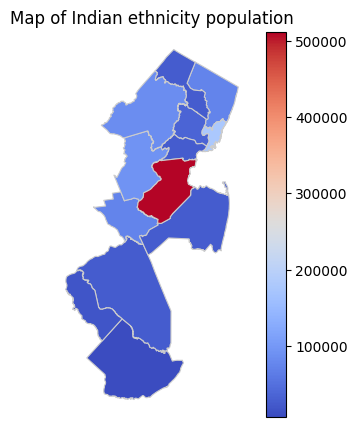

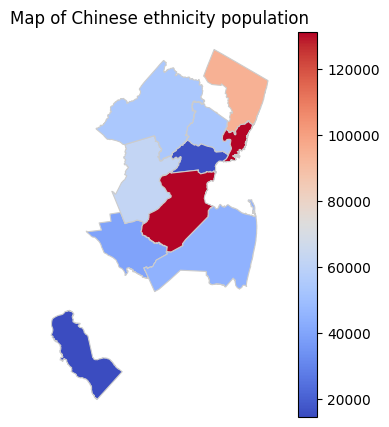

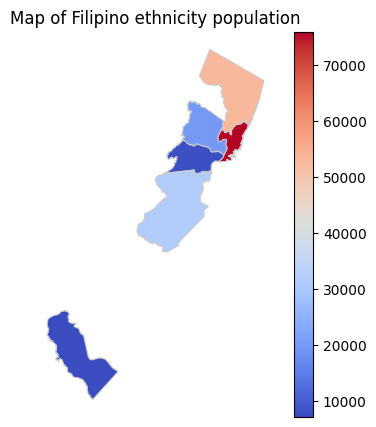

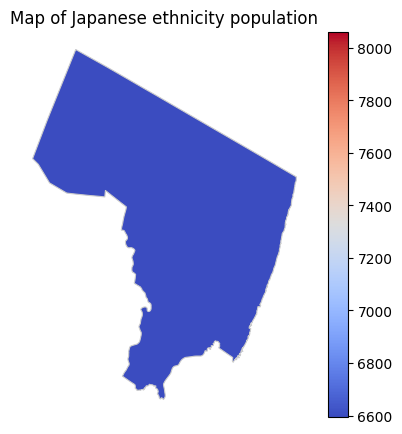

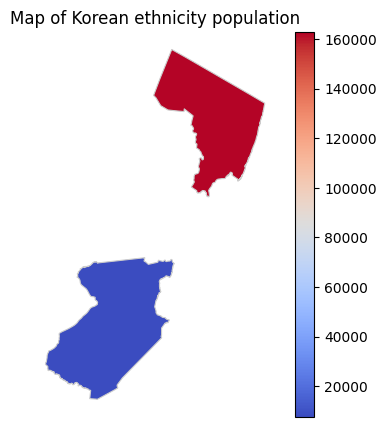

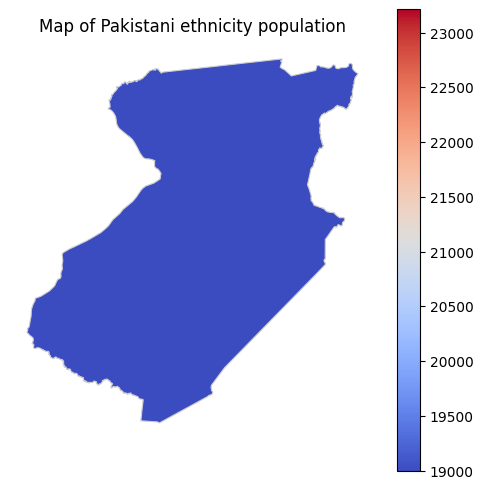

In [21]:
# Removing nan values
merged_data = merged_data[merged_data['category'].notna()]

# Get a list of unique ethnicity
ethnicity = merged_data['category'].unique()

# Create separate maps (facets) for each category
for category in ethnicity:
    subset = merged_data[merged_data['category'] == category]

    # Create a new plot for each category
    fig, ax = plt.subplots(1, 1, figsize=(5, 5))
    subset.plot(ax=ax,column = 'Estimate!!Total:' ,cmap='coolwarm', linewidth=0.8, edgecolor='0.8', legend=True)

    # Set title and labels
    ax.set_title(f'Map of {category} ethnicity population')
    ax.set_axis_off()

# Adjust spacing between subplots
plt.tight_layout()

# Show all the facets
plt.show()




Text(0.5, 1.0, 'Population density of Indians')

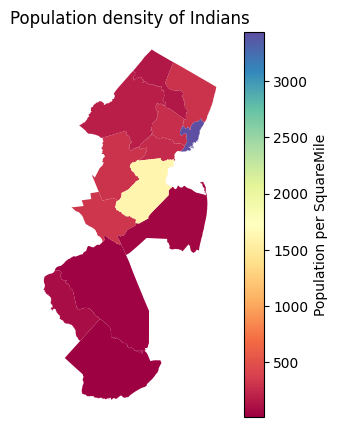

In [22]:
##Since the indian population is more lets deep dive into distribution and population density of the indian population

indian = merged_data[merged_data['category'] == 'Indian']
ax = indian.plot(column = 'pop_density(people/Sq Miles)',cmap = 'Spectral', legend = True,figsize =(5,5),legend_kwds={"label": "Population per SquareMile"})
ax.set_title(f'Population density of Indians')
ax.set_axis_off()


***Observation : Majority of the Indian population live in the northern most part of New Jersey. Lets try to analyse more by plotting people between the age group 17 - 65 as they have more purchasing power.***

/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


Text(0.5, 1.0, 'Distribution of age group between 17 and 66')

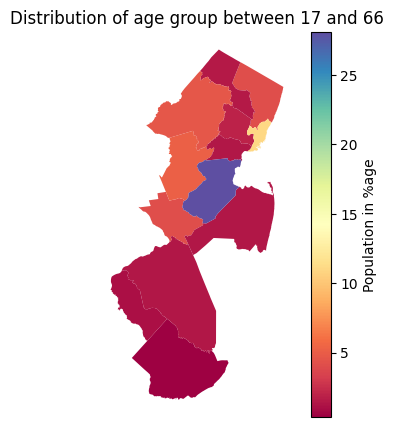

In [23]:
#Lets add both the male and female population between the age group 17 to 65

indian['Adult_age_group'] = indian['Male_age_upto_66'] + indian['Female_age_upto_66']
indian['percentage_adult'] = (indian['Adult_age_group'] / indian['Total_ethnicity_pop']) * 100

#Lets plot the map
base = indian.plot(column = 'percentage_adult',cmap = 'Spectral', legend = True,figsize =(5,5),legend_kwds={"label": "Population in %age"} )
base.set_title(f'Distribution of age group between 17 and 66')
base.set_axis_off()

### PUBLIC TRANSPORT ANALYSIS

Lets try to plot the Bus terminal of NJ Transit and the railway lines across NJ and see how the connectivity looks like

In [24]:
#Downlaoding the Bus terminus shapefile for NJ

! wget -q -O nj-counties.zip https://github.com/nihilkottal/GIS_class/raw/main/Bus_Terminals_of_NJ_Transit.zip
zip_ref = zipfile.ZipFile('nj-counties.zip', 'r'); zip_ref.extractall(); zip_ref.close() #just unzipping
Bus_terminal=gpd.read_file('Bus_Terminals_of_NJ_Transit.shp')
Bus_terminal = Bus_terminal.to_crs(epsg=3424)

In [25]:
#Downloading the railway line shapefile for NJ

! wget -q -O nj-counties.zip https://github.com/nihilkottal/GIS_class/raw/main/Rail_Lines_of_NJ_Transit.zip
zip_ref = zipfile.ZipFile('nj-counties.zip', 'r'); zip_ref.extractall(); zip_ref.close() #just unzipping
Rail_lines=gpd.read_file('NJTRANSIT_RAIL_LINES.shp')


<Axes: >

<Axes: >

Text(0.5, 1.0, 'Bus terminals and Railway line for NJ (Age group 17-66)')

<Axes: title={'center': 'Bus terminals and Railway line for NJ (Age group 17-66)'}>

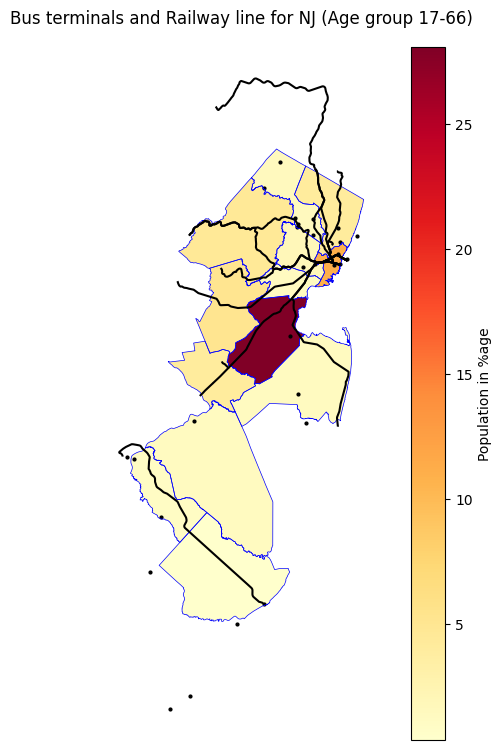

In [63]:
#Plotting both the Bus terminal and Rail line over the base layer of Indian population for the age group 17 - 65 map

base = indian.plot(column = 'percentage_adult',cmap = 'YlOrRd', legend = True,figsize =(9,9),legend_kwds={"label": "Population in %age"}  )
Bus_terminal.plot(ax = base, color = 'black', markersize = 4,figsize =(10,10) )
Rail_lines.plot(ax = base, color = 'black', markersize = 4,figsize =(10,10) )
base.set_title(f'Bus terminals and Railway line for NJ (Age group 17-66)')
base.set_axis_off()

indian.plot(ax=base,edgecolor='blue',linewidth=0.5, facecolor="none") #alpha=0.1)


**Observation : The northern part of New Jersey has very good NJ Transit rail connectivity compared to the South, Also, Middlesex county has the most number of Indian population in all of New Jersey (Potential Customers more in this particular County)**

In [27]:
### Downloading the NJ map shapefile with townships

! wget -q -O nj-counties.zip https://github.com/nihilkottal/GIS_class/raw/main/tl_2022_34_cousub.zip
zip_ref = zipfile.ZipFile('nj-counties.zip', 'r'); zip_ref.extractall(); zip_ref.close() #just unzipping
njC1=gpd.read_file('tl_2022_34_cousub.shp')
njC1.crs

<Geographic 2D CRS: EPSG:4269>
Name: NAD83
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: North America - onshore and offshore: Canada - Alberta; British Columbia; Manitoba; New Brunswick; Newfoundland and Labrador; Northwest Territories; Nova Scotia; Nunavut; Ontario; Prince Edward Island; Quebec; Saskatchewan; Yukon. Puerto Rico. United States (USA) - Alabama; Alaska; Arizona; Arkansas; California; Colorado; Connecticut; Delaware; Florida; Georgia; Hawaii; Idaho; Illinois; Indiana; Iowa; Kansas; Kentucky; Louisiana; Maine; Maryland; Massachusetts; Michigan; Minnesota; Mississippi; Missouri; Montana; Nebraska; Nevada; New Hampshire; New Jersey; New Mexico; New York; North Carolina; North Dakota; Ohio; Oklahoma; Oregon; Pennsylvania; Rhode Island; South Carolina; South Dakota; Tennessee; Texas; Utah; Vermont; Virginia; Washington; West Virginia; Wisconsin; Wyoming. US Virgin Islands. British Virgin Islands

In [28]:
### Cleaning the shapefile
njC1['NAMELSAD'] = njC1['NAMELSAD'].str.replace('City city', 'City')

In [29]:
#### Reading in the Property data
njC_land_value = pd.read_excel("https://github.com/nihilkottal/GIS_class/raw/main/22lirateables.xls",header = 1)

In [30]:
###Cleaning the data
njC_land_value = njC_land_value.dropna(subset=['Municipality'])
njC_land_value = njC_land_value.drop_duplicates(subset=['Municipality'])

In [31]:
### Calculating the Average commercial property price
njC_land_value['Avg_commercial_land_vle'] = njC_land_value['Commercial Value'] / njC_land_value['Commercial Parcels']
njC_land_value['Avg_Vacant_land_vle'] = njC_land_value['Vacant Land Value'] / njC_land_value['Vacant Land Parcels']

In [32]:
njC_land_value.columns

Index(['Muni Code', 'Municipality', 'County', 'Vacant Land Parcels',
       'Vacant Land Value', 'Residential Parcels', 'Residential Value',
       'Farm Homestead Parcels', 'Farm Homestead Value', 'Farm Land Parcels',
       'Farm Land Value', ' Residential & Farm Home % of Total Value',
       'Residential & Farm Home  Parcels',
       'Value of Residential, Farm Home & Apartment',
       'Avg Residential & Farm Home Value - 2022',
       'Avg Residential & Farm Home Value - 2021', '2021-22 Change',
       'Commercial Parcels', 'Commercial Value', 'Industrial Parcels',
       'Industrial Value', 'Apartment Parcels', 'Apartment Value',
       ' Apartment % of Total Value', 'Non-Residential Parcels',
       'Non-Residential Value', 'Total Parcels', 'Total Value',
       'Avg_commercial_land_vle', 'Avg_Vacant_land_vle'],
      dtype='object')

In [33]:
## Merging both the datasets

njC_land_value.rename(columns={'Municipality': 'NAMELSAD'}, inplace=True)
njC_land_value['NAMELSAD'] = njC1['NAMELSAD'].str.lower()
njC1['NAMELSAD'] = njC1['NAMELSAD'].str.lower()
merged_data2 = pd.merge(njC1, njC_land_value, on='NAMELSAD',how='outer',indicator=True)
len(merged_data2)


642

In [35]:
! wget -q -O nj-counties.zip https://github.com/nihilkottal/GIS_class/raw/main/CAFRA_and_Coastal_Centers_2010_of_New_Jersey.zip
zip_ref = zipfile.ZipFile('nj-counties.zip', 'r'); zip_ref.extractall(); zip_ref.close() #just unzipping
landscape=gpd.read_file('CAFRA_and_Coastal_Centers_(2010)_of_New_Jersey.shp')
landscape = landscape.to_crs(epsg=4269)

In [36]:
! wget -q -O nj-counties.zip https://github.com/nihilkottal/GIS_class/raw/main/Parks_in_New_Jersey.zip
zip_ref = zipfile.ZipFile('nj-counties.zip', 'r'); zip_ref.extractall(); zip_ref.close() #just unzipping
parks=gpd.read_file('Parks_in_New_Jersey.shp')
parks = parks.to_crs(epsg=4269)

**Creating a Centroid Thematic Map**

In [38]:
ind = indian.copy()

ind["geometry"] = ind["geometry"].centroid

<Axes: >

[]

[]

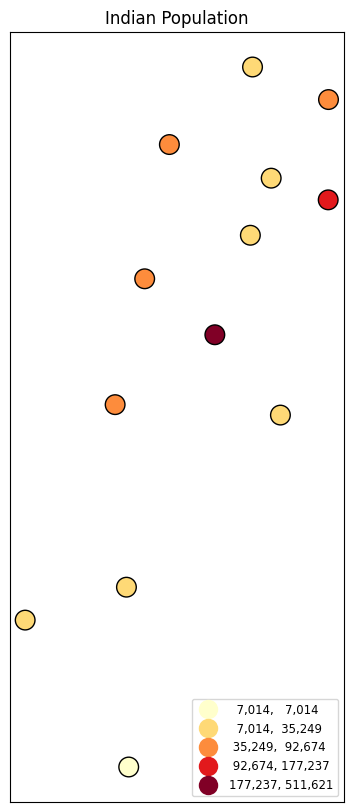

In [39]:
fig, ax = plt.subplots(1, figsize=(6,10))
ind.plot(ax=ax,column='Estimate!!Total:',legend=True,cmap='YlOrRd',scheme='natural_breaks',k=5,
         edgecolor='black',linewidth=1,legend_kwds= {"fmt": "{:,.0f}",
        'loc':'lower right','title_fontsize':'medium','fontsize':'small','markerscale':1.4},
         markersize = 200) #
ax.title.set_text("Indian Population")
ax.set_xticks([]); ax.set_yticks([])

<Axes: >

<Axes: >

[]

[]

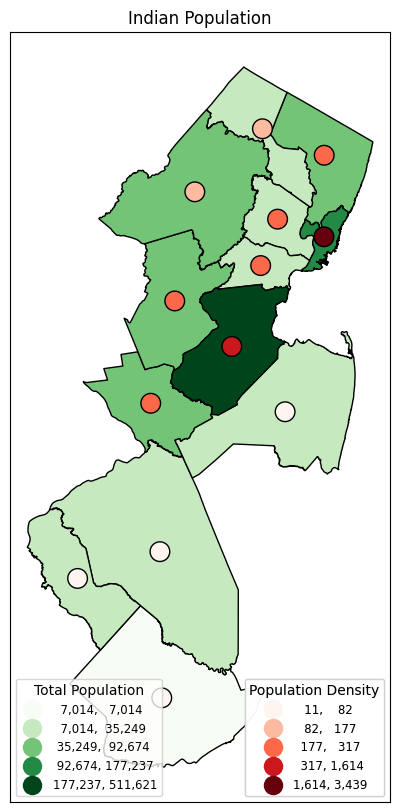

In [40]:
fig, ax = plt.subplots(1, figsize=(6,10))
indian.plot(ax=ax,column='Estimate!!Total:',legend=True,cmap='Greens',scheme='natural_breaks',k=5,
         edgecolor='black',linewidth=1,legend_kwds= {"fmt": "{:,.0f}",
        'loc':'lower left','title_fontsize':'medium','fontsize':'small','markerscale':1.4})

l1 = ax.get_legend()
l1.set_title('''Total Population''')

ind.plot(ax=ax,column='pop_density(people/Sq Miles)',legend=True,cmap='Reds',scheme='natural_breaks',k=5,
         edgecolor='black',linewidth=1,legend_kwds= {"fmt": "{:,.0f}",
        'loc':'lower right','title_fontsize':'medium','fontsize':'small','markerscale':1.4},
         markersize = 200) #

ax.title.set_text("Indian Population")
ax.set_xticks([]); ax.set_yticks([])

l2 = ax.get_legend()
l2.set_title('''Population Density''')

ax.add_artist(l2)
ax.add_artist(l1)

**This particular Centroid Thematic map compares the Total Indian Population versus the Population Density in each county. As observerd previously Middlesex County has favourable values.**

**Analysing the Land and Property values**

<Axes: >

[]

[]

<Axes: >

<Axes: >

[]

[]

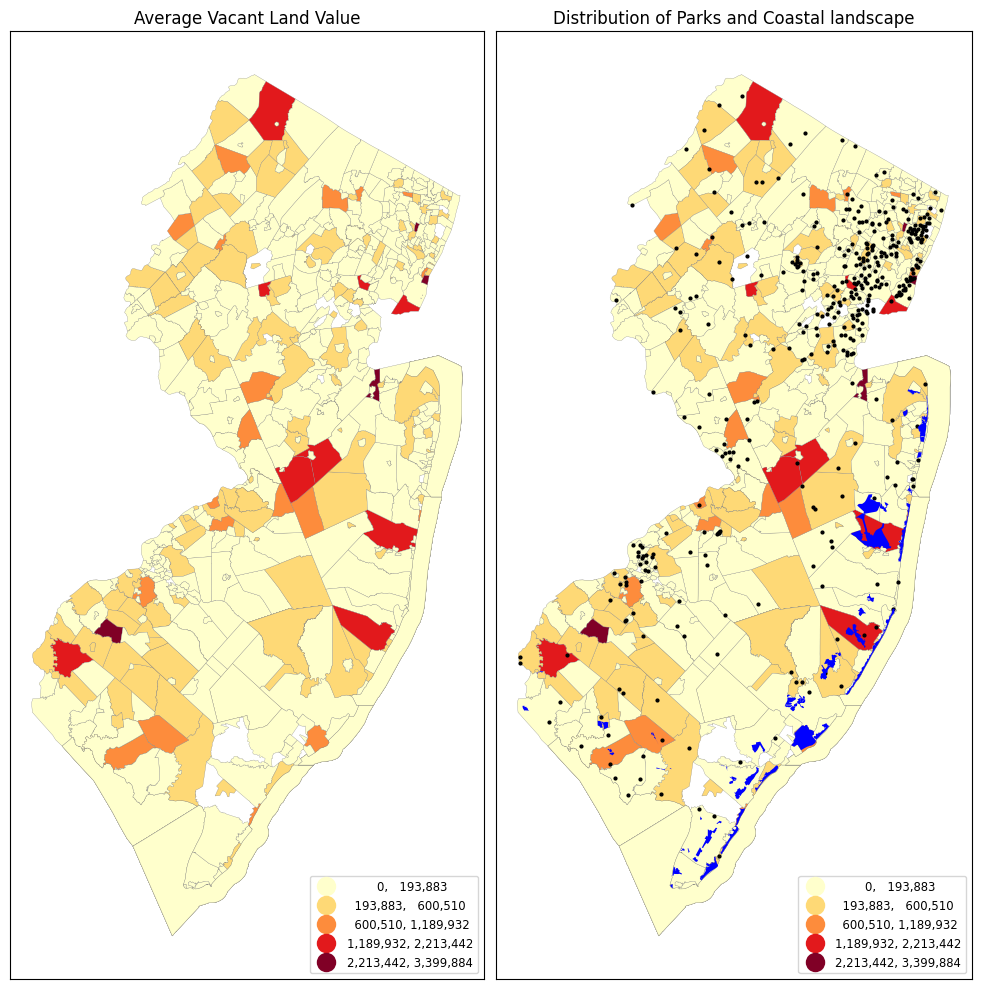

In [41]:
fig, axs = plt.subplots(1,2, figsize=(10,10),sharey=True, tight_layout=True)
merged_data2.plot(ax=axs[0],column='Avg_Vacant_land_vle',legend=True,cmap='YlOrRd',scheme='natural_breaks',k=5,
         edgecolor='grey',linewidth=0.2,legend_kwds= {"fmt": "{:,.0f}",
        'loc':'lower right','title_fontsize':'medium','fontsize':'small','markerscale':1.4}) #
axs[0].title.set_text("Average Vacant Land Value")
axs[0].set_xticks([]); axs[0].set_yticks([])

a = merged_data2.plot(ax=axs[1],column='Avg_Vacant_land_vle',legend=True,cmap='YlOrRd',scheme='natural_breaks',k=5,
         edgecolor='grey',linewidth=0.2,legend_kwds= {"fmt": "{:,.0f}",
        'loc':'lower right','title_fontsize':'medium','fontsize':'small','markerscale':1.4}) #
parks.plot(ax = a, color = 'black', markersize = 4,figsize =(8,8) )
landscape.plot(ax = a, color = 'blue', figsize =(8,8) )
axs[1].title.set_text("Distribution of Parks and Coastal landscape")
axs[1].set_xticks([]); axs[1].set_yticks([])

**In this map we are comparing the Vacant land value. The size of the land here is of varying parcels ( it can be either 1 Acre or 10 Acre. Average value has been calculated) Land with value less than 600K should be an ideal choice but the choice of location here is based completely on the individuals purchase power.**

**Also, The coastal Areas and the Parks have been plotted as it can play vital role in the land value and land selection.**

<Axes: >

[]

[]

<Axes: >

<Axes: >

[]

[]

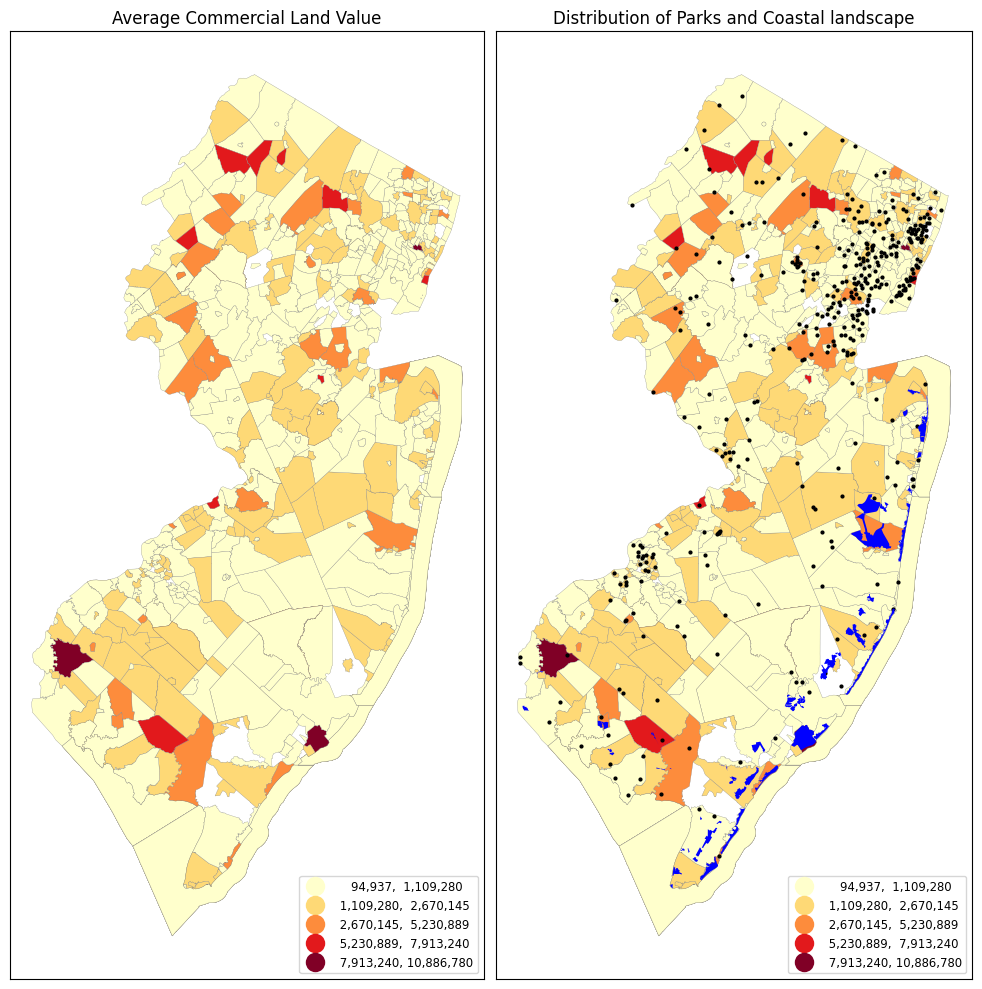

In [42]:
fig, axs = plt.subplots(1,2, figsize=(10,10),sharey=True, tight_layout=True)
merged_data2.plot(ax=axs[0],column='Avg_commercial_land_vle',legend=True,cmap='YlOrRd',scheme='natural_breaks',k=5,
         edgecolor='grey',linewidth=0.2,legend_kwds= {"fmt": "{:,.0f}",
        'loc':'lower right','title_fontsize':'medium','fontsize':'small','markerscale':1.4}) #
axs[0].title.set_text("Average Commercial Land Value")
axs[0].set_xticks([]); axs[0].set_yticks([])

a = merged_data2.plot(ax=axs[1],column='Avg_commercial_land_vle',legend=True,cmap='YlOrRd',scheme='natural_breaks',k=5,
         edgecolor='grey',linewidth=0.2,legend_kwds= {"fmt": "{:,.0f}",
        'loc':'lower right','title_fontsize':'medium','fontsize':'small','markerscale':1.4}) #
parks.plot(ax = a, color = 'black', markersize = 4,figsize =(8,8) )
landscape.plot(ax = a, color = 'blue', figsize =(8,8) )
axs[1].title.set_text("Distribution of Parks and Coastal landscape")
axs[1].set_xticks([]); axs[1].set_yticks([])

**As shown in the previous graph, The land values in each municipalities have been plotted and the only change here is that these stats are for commercial lands.**

<Axes: >

Text(0.5, 0, 'Land value (in K)')

Text(0, 0.5, 'Count of properties')

Text(0.5, 1.0, 'Histogram of Avg_Vacant_land_vle')

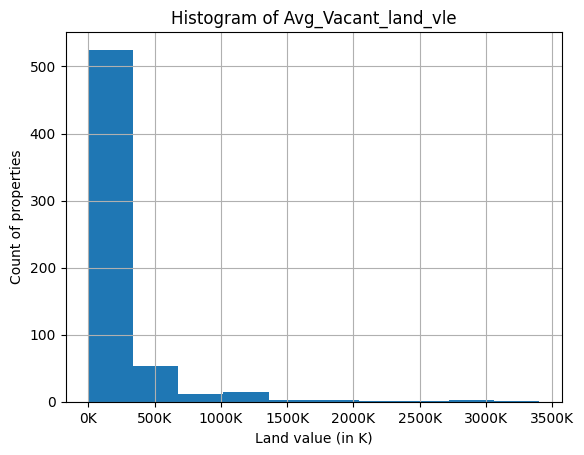

<Axes: >

Text(0.5, 0, 'Land value (in K)')

Text(0, 0.5, 'Count of properties')

Text(0.5, 1.0, 'Histogram of Avg_Commercial_land_vle')

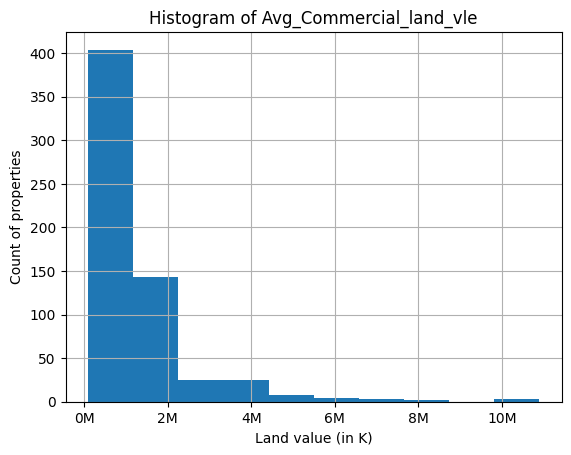

In [43]:
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker

merged_data2.Avg_Vacant_land_vle.hist()
plt.gca().xaxis.set_major_formatter(mticker.FuncFormatter(lambda x, pos: f'{x / 1e3:.0f}K'))
plt.xlabel("Land value (in K)")
plt.ylabel("Count of properties")
plt.title("Histogram of Avg_Vacant_land_vle")
plt.show()

import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
merged_data2.Avg_commercial_land_vle.hist()
plt.gca().xaxis.set_major_formatter(mticker.FuncFormatter(lambda x, pos: f'{x / 1e6:.0f}M'))
plt.xlabel("Land value (in K)")
plt.ylabel("Count of properties")
plt.title("Histogram of Avg_Commercial_land_vle")
plt.show()

**One of the major relationship between the two datasets i.e Vacant land and commercial land values is that the value of the Vacant land almost always doubles if one were to build some sort of commercial complex in the already existing land. (Potential business idea where you can sell vacant lands by giving it a slight makeover)**

# **BillBoard Onlooker Stats**

**The stats shown below is from a survey conducted on Americal population aged 18 and above. it tells us that almost 71% of the people surveyed remembered the Billboard advertising or noticed it while travelling.**

**In the upcoming plot's I have tried to analyse the traffic data so that we can explore potential hotspots for advertising our business.**



![](https://raw.githubusercontent.com/nihilkottal/GIS_class/main/Billiboard%20Stats.PNG)

In [44]:
import geopandas as gpd

# Specify the path to your GeoJSON file
geojson_file = "https://github.com/nihilkottal/GIS_class/raw/main/NJ_County.geojson"

# Read the GeoJSON file
gdf = gpd.read_file(geojson_file)

In [45]:
import time, webbrowser, zipfile

import pandas as pd
import geopandas as gpd

from google.colab import data_table
data_table.enable_dataframe_formatter()

from geopandas.tools import geocode
#! pip install geocoder
from geopy.geocoders import Nominatim
#if you do a lot of geocoding:
#https://developers.google.com/maps/documentation/geocoding/overview

geolocator = Nominatim(user_agent='blah@gmail.com')


import folium as f
from folium.plugins import MarkerCluster, HeatMap

#will display all output not just last command
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

In [46]:
f.Map(location=[40, -75])

In [47]:
import pandas as pd
! wget -q -O nj-counties.zip https://github.com/nihilkottal/GIS_class/raw/main/Traffic_Counts_Data_20231102.zip

zip_ref = zipfile.ZipFile('nj-counties.zip', 'r'); zip_ref.extractall(); zip_ref.close() #just unzipping


njC_Traffic=pd.read_csv('Traffic_Counts_Data_20231102.csv')

In [48]:
njC_Traffic.head(2)

,Station Number,Standard Route Identifier,Mile Marker,Latitude,Longitude,County Code,Municipal Code,County,Municipality,Annual Average Daily Traffic,Annual Average Daily Traffic North/East (See Direction Field),Annual Average Daily Traffic South/West (See Direction Field),Year,Station Type,Direction
0,110498,04000678__,0.18,39.843864,-75.019110,4,431,Camden,Somerdale Boro,"9,606","5,134","4,472",01/01/2012,Volume 48hrs,East/West
1,1-8-773,19081007__,0.06,40.951831,-74.789697,19,1908,Sussex,Green Twp,"1,187",615,572,01/01/2012,Volume 48hrs,East/West


In [49]:
njC_Traffic['date_column'] = pd.to_datetime(njC_Traffic['Year'])

In [50]:
njC_Traffic_2020 = njC_Traffic[njC_Traffic['date_column'].dt.year == 2020]

In [51]:
njC_Traffic_2020_Camden = njC_Traffic_2020[njC_Traffic_2020['County'] == 'Camden']

In [52]:
import folium as f
import folium
from folium.plugins import MarkerCluster

njfran_map = f.Map(location=(40, -75), zoom_start=12)


incidents = MarkerCluster().add_to(njfran_map)


for lat, lng, direction, traffic in zip(njC_Traffic_2020.Latitude, njC_Traffic_2020.Longitude, njC_Traffic_2020.Direction, njC_Traffic_2020['Annual Average Daily Traffic']):
    popup_content = f"<b>Direction:</b> {direction}<br><b>Annual Average Daily Traffic:</b> {traffic}"
    marker_icon = f.Icon(color="red")
    f.Marker(
        location=[lat, lng],
        icon=marker_icon,
        popup=popup_content,
    ).add_to(incidents)

njfran_map

In [53]:
import folium
from folium.plugins import FloatImage

map = folium.Map(location= (40, -75),
                 zoom_start=12,
                 )



# add a legend diagram to map
compass_rose = folium.FeatureGroup('compass rose')
FloatImage('https://upload.wikimedia.org/wikipedia/commons/9/99/Compass_rose_simple.svg', bottom =80, left = 7).add_to(compass_rose)
compass_rose.add_to(njfran_map)



display(njfran_map)

**The folium map above is a cluster map which shows the Average daily traffic and the direction of traffic throughout New Jersey. I have also added a compass in order to make sense of the direction mentioned in each marker**

In [54]:
njC_Traffic_2020['Annual Average Daily Traffic'] = njC_Traffic_2020['Annual Average Daily Traffic'].str.replace(",", "")
njC_Traffic_2020['Annual Average Daily Traffic'] = pd.to_numeric(njC_Traffic_2020['Annual Average Daily Traffic'])
location = njC_Traffic_2020.groupby(['Latitude', 'Longitude'])['Annual Average Daily Traffic'].sum().reset_index()
location = location.rename(columns={'Annual Average Daily Traffic': 'count'})


location['color']=location['count'].apply(lambda count:"red" if count>=90000 else
                                         "Orange" if count>=80000 and count<90000 else
                                         "Yellow" if count>=60000 and count<80000 else
                                         "darkblue" if count>=40000 and count<60000 else
                                         "Black" if count>=20000 and count<40000 else
                                         "Violet" if count>=10000 and count<20000 else
                                         "brown" if count>=5000 and count<10000 else
                                         "green")
location['size']=location['count'].apply(lambda count:22 if count>=90000 else
                                         20 if count>=80000 and count<90000 else
                                         18 if count>=60000 and count<80000 else
                                         15 if count>=40000 and count<60000 else
                                         10 if count>=20000 and count<40000 else
                                         8 if count>=10000 and count<20000 else
                                         7 if count>=5000 and count<10000 else
                                         4)
m=folium.Map([40,-75],zoom_start=11)
#location=location[0:2000]
for lat,lon,color,count,size in zip(location['Latitude'],location['Longitude'],location['color'],location['count'],location['size']):
     folium.CircleMarker([lat, lon],
                            popup=count,
                            radius=size,
                            color='b',
                            fill=True,
                            fill_opacity=0.7,
                            fill_color=color,
                           ).add_to(m)
m

<ipython-input-54-955ecee184c0>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  njC_Traffic_2020['Annual Average Daily Traffic'] = njC_Traffic_2020['Annual Average Daily Traffic'].str.replace(",", "")
<ipython-input-54-955ecee184c0>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  njC_Traffic_2020['Annual Average Daily Traffic'] = pd.to_numeric(njC_Traffic_2020['Annual Average Daily Traffic'])


**The Custom folium map above shows a much clearer visual regarding the daily traffic. It is much easier to distinguish the areas with more traffic. As expected, Routes close to the urban areas has more traffic than the traffic in the inner routes.**

**The counties and muncipalities around New York is the best place to advertise due to the high volume in traffic. Also, The placement of the advertisement depends on the location and type of our business.**

In [58]:
Traffic_stats = pd.read_excel("https://github.com/nihilkottal/GIS_class/raw/main/TTI-2022-1-data.xlsx",header = 1)

/usr/local/lib/python3.10/dist-packages/openpyxl/worksheet/_reader.py:329: UserWarning: Unknown extension is not supported and will be removed
  warn(msg)
/usr/local/lib/python3.10/dist-packages/openpyxl/worksheet/_reader.py:329: UserWarning: Conditional Formatting extension is not supported and will be removed
  warn(msg)


In [59]:
filtered_df = Traffic_stats.dropna(subset=['Unnamed: 1'])
filtered_df = filtered_df[filtered_df['Unnamed: 1'].str.contains('NJ')]
filtered_df.rename(columns={'Unnamed: 1': 'Urban_Area','Unnamed: 5': 'Avg_Delay_per_Veh(sec)','Unnamed: 2': 'No_of_Signals','Weekly': 'Weekly_Delay(hr)','Annual': 'Annual_Delay(hr)'}, inplace=True)
filtered_df = filtered_df.loc[:, filtered_df.columns[1:6]]

In [60]:
filtered_df.head(10)

,Urban_Area,No_of_Signals,Weekly_Delay(hr),Annual_Delay(hr),Avg_Delay_per_Veh(sec)
3,Allentown PA-NJ,451.0,178512.40,9.282645e+06,17.261170
58,New York-Newark NY-NJ-CT,15789.0,7378015.97,3.836568e+08,21.489724
64,Philadelphia PA-NJ-DE-MD,4189.0,1798659.36,9.353029e+07,18.512472
68,Poughkeepsie-Newburgh NY-NJ,272.0,113432.94,5.898513e+06,17.316565
113,Atlantic City NJ,436.0,126449.77,6.575388e+06,15.786258
183,East Stoudsburg PA-NJ,49.0,17242.37,8.966032e+05,16.776024
421,Trenton NJ,285.0,80587.20,4.190534e+06,16.057718
423,Twin Rivers-Highstown NJ,54.0,18939.24,9.848405e+05,13.527733
433,Villas NJ,72.0,14513.00,7.546760e+05,15.153641
434,Vineland NJ,85.0,27934.99,1.452619e+06,15.440779


Text(0.5, 0, 'Urban Area')

Text(0, 0.5, 'Weekly Delay in Hours(Million)')

<BarContainer object of 10 artists>

Text(0, 0.5, 'Avg Wait per Vehicle (Seconds)')

Text(0.5, 1.0, 'Weekly Total Delay and Average Wait per Vehicle by Urban Area')

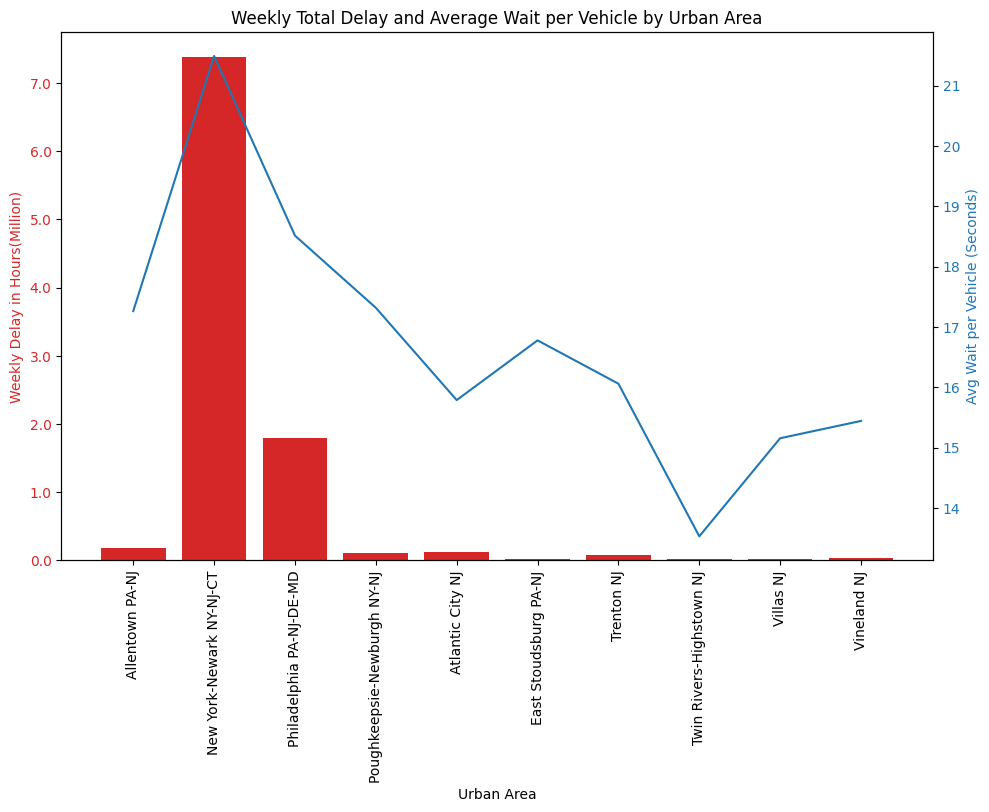

In [61]:

import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

# Helper function to format the y-axis ticks as normal numbers
def millions_formatter(x, pos):
    return '%1.1f' % (x * 1e-6)

fig, ax1 = plt.subplots(figsize=(10, 8))

# Bar plot for 'Annual Delay in Hours'
color = 'tab:red'
ax1.set_xlabel('Urban Area')
ax1.set_ylabel('Weekly Delay in Hours(Million)', color=color)
ax1.bar(filtered_df['Urban_Area'], filtered_df['Weekly_Delay(hr)'], color=color)
ax1.tick_params(axis='y', labelcolor=color)
ax1.tick_params(axis='x', rotation=90)

# Set the formatter for the y-axis of ax1
ax1.yaxis.set_major_formatter(FuncFormatter(millions_formatter))

# Instantiate a second axes that shares the same x-axis
ax2 = ax1.twinx()

# Line plot for 'Average Wait per Vehicle'
color = 'tab:blue'
ax2.set_ylabel('Avg Wait per Vehicle (Seconds)', color=color)
ax2.plot(filtered_df['Urban_Area'], filtered_df['Avg_Delay_per_Veh(sec)'], color=color)
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()  # To ensure the tight layout so everything fits
plt.title('Weekly Total Delay and Average Wait per Vehicle by Urban Area')
plt.show()

**The above graph shows the stats for the total accumulated delay for all vehicles and the average wait time per vehicle on a weekly basis. A traveller waits upto 21 seconds at each traffic signal along major city routes which presents us with the perfect opportunity to place our billboard advertisements for maximum views.**

In [ ]:



  from google.colab import files
  selected_columns.to_csv('selected_columns.csv', index=False)
  # Download the file to your local machine
  files.download('selected_columns.csv')

AttributeError: ignored